# 📚 Image Captioning Challenge 📚

## 0-Imports



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
from transformers import Blip2Processor, Blip2ForConditionalGeneration
import torch
from tqdm import tqdm
from numpy import cov, trace, iscomplexobj
from scipy.linalg import sqrtm
import numpy as np
import os

## 1- Data Reading

In [2]:
from google.colab import drive
drive.mount('/content/drive')

!unzip -q "/content/drive/MyDrive/caption_dataset/caption_dataset.zip" -d "/content/dataset/"

# === Notebook Constants ===
DATASET_PATH = "/content/dataset/"
TRAIN_CSV = os.path.join(DATASET_PATH, "train.csv")
TEST_CSV = os.path.join(DATASET_PATH, "test.csv")
SUBMISSION_FILE = "submission.csv"

# === Data Loading and Basic Exploration ===
train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)
print(f"Train shape: {train_df.shape}, Test shape: {test_df.shape}")
train_df.head()


Mounted at /content/drive
Train shape: (21367, 2), Test shape: (3771, 1)


,image_id,caption
0,0,The image features a comic-style panel depicti...
1,1,"Colorful postcard featuring ""Greetings from Ch..."
2,2,Two vending machines display a variety of drin...
3,3,A man speaks at the eGovernment Conference 201...
4,4,A close-up of several silver coins stacked tog...


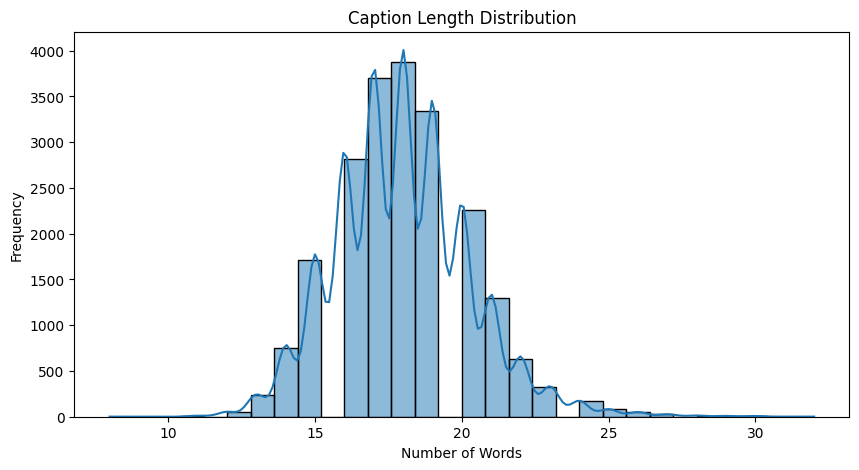

Unique captions: 21367
Average caption length: 17.971732110263492


In [3]:
train_df['caption_length'] = train_df['caption'].apply(lambda x: len(x.split()))
plt.figure(figsize=(10,5))
sns.histplot(train_df['caption_length'], bins=30, kde=True)
plt.title("Caption Length Distribution")
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.show()
print("Unique captions:", train_df['caption'].nunique())
print("Average caption length:", train_df['caption_length'].mean())


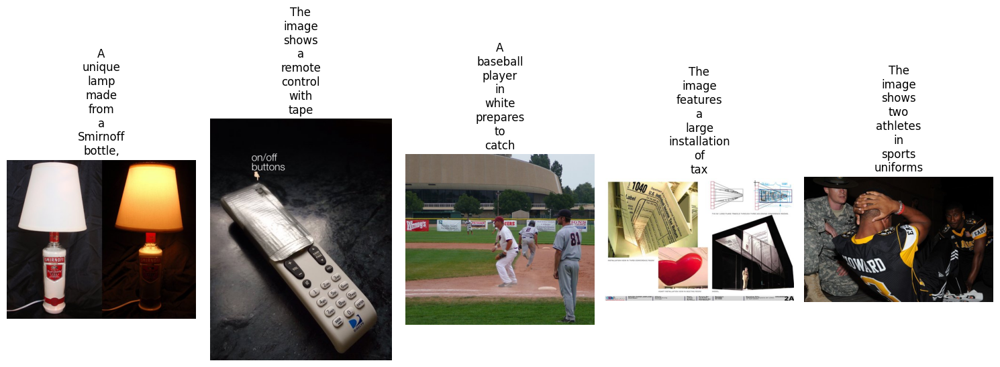

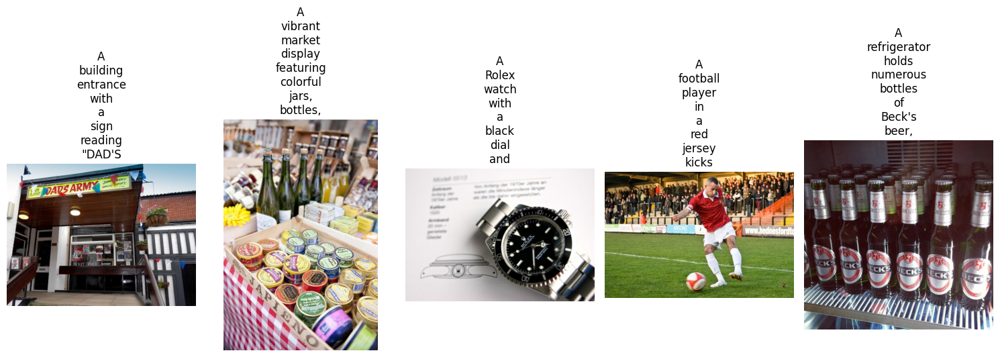

In [22]:
def show_random_examples(df, n=5):
    fig, axes = plt.subplots(1, n, figsize=(15, 5))
    for i in range(n):
        row = df.sample(1).iloc[0]
        img_filename = f"{row['image_id']}.jpg"
        img_path = f"/content/dataset/train/train/{img_filename}"
        if not os.path.exists(img_path):
            print(f"Image not found: {img_path}")
            continue
        image = Image.open(img_path).convert("RGB")
        axes[i].imshow(image)
        axes[i].axis("off")
        axes[i].set_title("\n".join(row['caption'].split()[:8]))
    plt.tight_layout()
    plt.show()

show_random_examples(train_df, 5)
show_random_examples(train_df, 5)

In [5]:
print("Unique captions:", train_df['caption'].nunique())
print("Average caption length:", train_df['caption_length'].mean())


Unique captions: 21367
Average caption length: 17.971732110263492


## 2- Data Preprocessing and Modelling

In [6]:
processor = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")
train_df['caption_proc'] = train_df['caption'].apply(lambda x: "<start> " + x.strip() + " <end>")

blip_model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b",
                                                           device_map="auto", # distrubute CPU/GPU
                                                           torch_dtype=torch.float16)# float16 for Vram

device = "cuda" if torch.cuda.is_available() else "cpu"

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/882 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.56M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/23.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/68.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.03k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/122k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/10.0G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

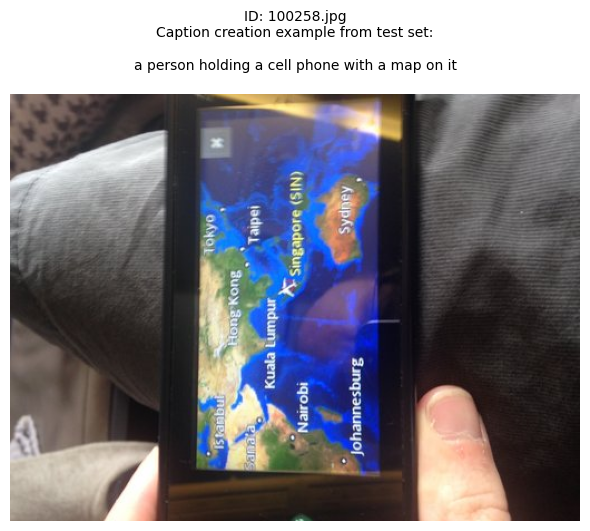

In [7]:
# Create example caption
sample_row = test_df.sample(1).iloc[0]
sample_img_id = str(sample_row['image_id'])
if not sample_img_id.endswith(".jpg"):
    sample_img_id += ".jpg"
img_path = f"/content/dataset/test/test/{sample_img_id}"

image = Image.open(img_path).convert("RGB")
inputs = processor(images=image, return_tensors="pt")
inputs = {k: v.to(device, dtype=torch.float16) for k, v in inputs.items()}

with torch.no_grad():
    generated_ids = blip_model.generate(**inputs, max_new_tokens=30, do_sample=False)
caption = processor.tokenizer.decode(generated_ids[0], skip_special_tokens=True)

plt.figure(figsize=(6,6))
plt.imshow(image)
plt.axis("off")
plt.title(f"ID: {sample_img_id}\nCaption creation example from test set:\n\n{caption}", fontsize=10)
plt.tight_layout()
plt.show()

## 3-Creating Captions For submission.csv

In [8]:
submission = []

for _, row in tqdm(test_df.iterrows(), total=len(test_df)):
    img_id = str(row["image_id"])
    if not img_id.endswith(".jpg"):
        img_id += ".jpg"
    img_path = os.path.join(DATASET_PATH, "test", "test", img_id)

    try:

        image = Image.open(img_path).convert("RGB")
        image = image.resize((224,224))
    except Exception as e:
        print(f"Image not found or corrupted: {img_path}")
        continue


    inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)

    with torch.no_grad():
        generated_ids = blip_model.generate(
            **inputs,
            max_length=40,           # Max token length
            num_beams=5,             # Beam Search
            temperature=0.7,         # Sampling temperature
            top_k=50,                # Top-k sampling
            top_p=0.9,               # Nucleus (Top-p) sampling
            early_stopping=True,
            repetition_penalty=1.2   # lower repetition
        )

    # Caption decode and postprocessing
    caption = processor.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
    caption = caption.strip().capitalize()

    # Caption length control
    word_count = len(caption.split())
    if word_count < 10:
        caption += "."
    elif word_count > 25:
        caption = " ".join(caption.split()[:25]) + "."

    submission.append({
        "image_id": img_id,
        "caption": caption
    })

submission_df = pd.DataFrame(submission)
submission_df.to_csv(SUBMISSION_FILE, index=False)
print(f"Submission file '{SUBMISSION_FILE}' created with {len(submission_df)} rows.")
submission_df.head()

  0%|          | 0/3771 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/transformers/generation/configuration_utils.py:631: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.7` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/transformers/generation/configuration_utils.py:636: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
100%|██████████| 3771/3771 [19:38<00:00,  3.20it/s]

Submission file 'submission.csv' created with 3771 rows.


,image_id,caption
0,100000.jpg,A large red sign that says ab.
1,100001.jpg,A person's hand holding a wallet.
2,100002.jpg,An asian store at night with.
3,100003.jpg,A red and black laptop sitting on.
4,100004.jpg,A framed cross stitch with the words.


## 5- CALCULATE FGD SCORE

In [9]:
!pip install -q sentence-transformers
from sentence_transformers import SentenceTransformer
gte_model = SentenceTransformer("thenlper/gte-small")

gt_df = pd.read_csv("/content/dataset/train.csv")
pred_df = pd.read_csv("submission.csv")
N = min(len(gt_df), len(pred_df))
gt_captions = gt_df["caption"].values[:N]
pred_captions = pred_df["caption"].values[:N]

gt_embed = gte_model.encode(list(gt_captions), batch_size=64, show_progress_bar=True)
pred_embed = gte_model.encode(list(pred_captions), batch_size=64, show_progress_bar=True)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 95.2 MB/s eta 0:00:00


modules.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/68.1k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/57.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/583 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/66.7M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/394 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/59 [00:00<?, ?it/s]

Batches:   0%|          | 0/59 [00:00<?, ?it/s]

In [10]:
# Function from the datathon main page
def calculate_fgd(solution_embed: np.ndarray, submission_embed: np.ndarray) -> float:
    fgd_list = []
    for _idx, (sol_emb_sample, sub_emb_sample) in enumerate(zip(solution_embed, submission_embed)):
        sol_emb_sample_rshaped = sol_emb_sample.reshape((1,384))
        sub_emb_sample_rshaped = sub_emb_sample.reshape((1,384))
        e1 = np.concatenate([sol_emb_sample_rshaped, sol_emb_sample_rshaped])
        e2 = np.concatenate([sub_emb_sample_rshaped, sub_emb_sample_rshaped])
        mu1, sigma1 = e1.mean(axis=0), cov(e1, rowvar=False)
        mu2, sigma2 = e2.mean(axis=0), cov(e2, rowvar=False)
        ssdiff = np.sum((mu1 - mu2)**2.0)
        covmean = sqrtm(sigma1.dot(sigma2))
        if iscomplexobj(covmean):
            covmean = covmean.real
        fgd = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
        fgd_list.append(fgd)
    return float(np.mean(fgd_list))

In [11]:
fgd_score = calculate_fgd(gt_embed, pred_embed)
print(f"\nFinal FGD Score: {fgd_score:.4f}")



Final FGD Score: 0.4603



🎥 Random 50 Sample Outputs with Images:



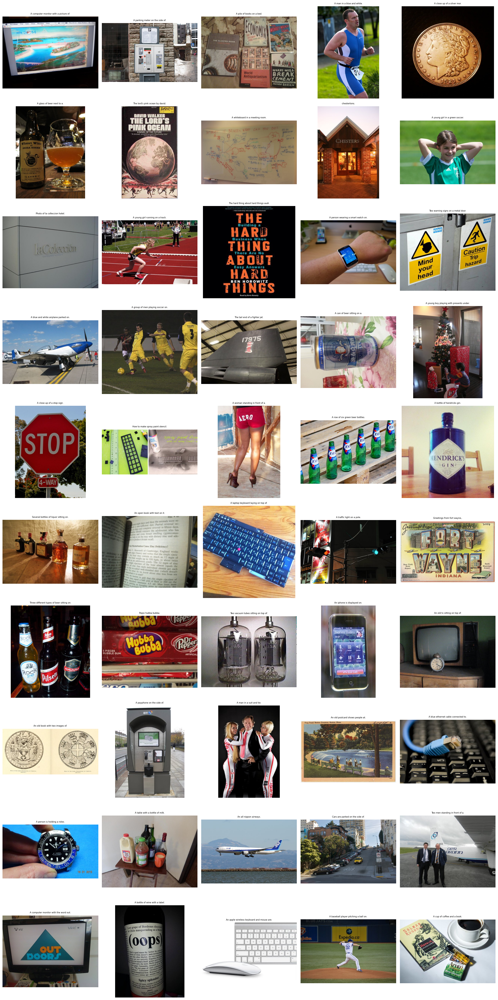

In [20]:
print("\n🎥 Random 50 Sample Outputs with Images:\n")
sample_df = submission_df.sample(50, random_state=42)

rows, cols = 10, 5
fig, axes = plt.subplots(rows, cols, figsize=(20, 40))
axes = axes.flatten()

for ax, (_, row) in zip(axes, sample_df.iterrows()):
    img_path = os.path.join(DATASET_PATH, "test", "test", row['image_id'])
    try:
        image = Image.open(img_path).convert("RGB")
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(f"{row['caption']}", fontsize=6)
    except:
        ax.axis("off")
        ax.set_title(f"Image not found", fontsize=6)

plt.tight_layout()
plt.show()